In [1]:
import pandas as pd
import numpy as np

In [2]:
train = pd.read_csv(r"/home/aifruaduser/Hayagriva/whatsapp_agent/Big_mart_sales/Data/train_v9rqX0R.csv")
train.head(2)

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228


In [3]:
train.columns

Index(['Item_Identifier', 'Item_Weight', 'Item_Fat_Content', 'Item_Visibility',
       'Item_Type', 'Item_MRP', 'Outlet_Identifier',
       'Outlet_Establishment_Year', 'Outlet_Size', 'Outlet_Location_Type',
       'Outlet_Type', 'Item_Outlet_Sales'],
      dtype='object')

In [4]:
train.isnull().sum()

Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64

In [5]:
test = pd.read_csv(r"/home/aifruaduser/Hayagriva/whatsapp_agent/Big_mart_sales/Data/test_AbJTz2l.csv")
test.head(2)

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type
0,FDW58,20.75,Low Fat,0.007565,Snack Foods,107.8622,OUT049,1999,Medium,Tier 1,Supermarket Type1
1,FDW14,8.30,reg,0.038428,Dairy,87.3198,OUT017,2007,NaN,Tier 2,Supermarket Type1


In [6]:
test.isnull().sum()

Item_Identifier                 0
Item_Weight                   976
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  1606
Outlet_Location_Type            0
Outlet_Type                     0
dtype: int64

In [7]:
len(set(train["Outlet_Identifier"]).intersection(set(test["Outlet_Identifier"])))

10

In [8]:
len(set(train["Outlet_Identifier"])), len(set(test["Outlet_Identifier"]))

(10, 10)

In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

# For preprocessing
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score

# Models
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

# EDA

In [10]:
train.shape, test.shape

((8523, 12), (5681, 11))

In [11]:
# Check missing values
train.isnull().sum()

Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64

In [12]:
test.isnull().sum()

Item_Identifier                 0
Item_Weight                   976
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  1606
Outlet_Location_Type            0
Outlet_Type                     0
dtype: int64

Text(0.5, 1.0, 'Distribution of Item_Outlet_Sales')

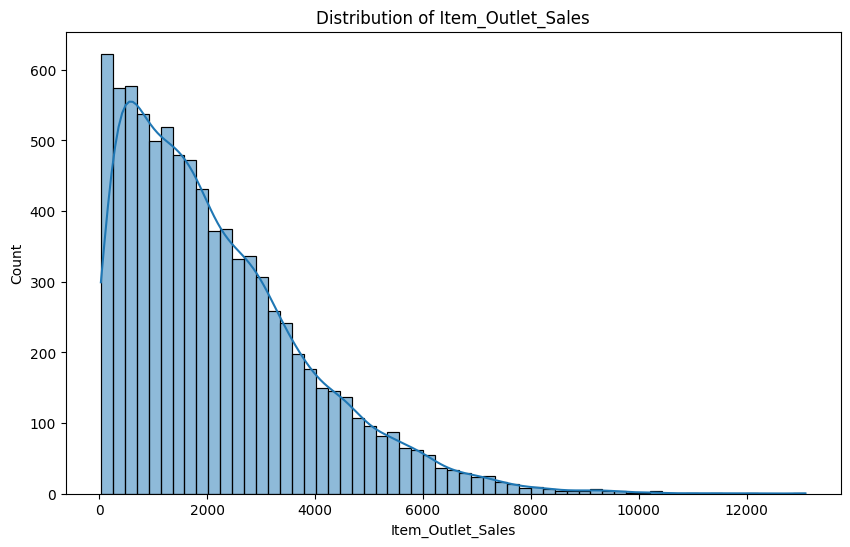

In [13]:
# Target variable distribution
plt.figure(figsize=(10, 6))
sns.histplot(train['Item_Outlet_Sales'], kde=True)
plt.title('Distribution of Item_Outlet_Sales')

**Skewness** The distribution appears to be right-skewed, indicating that most items have lower sales, while a few items have very high sales.

<Axes: >

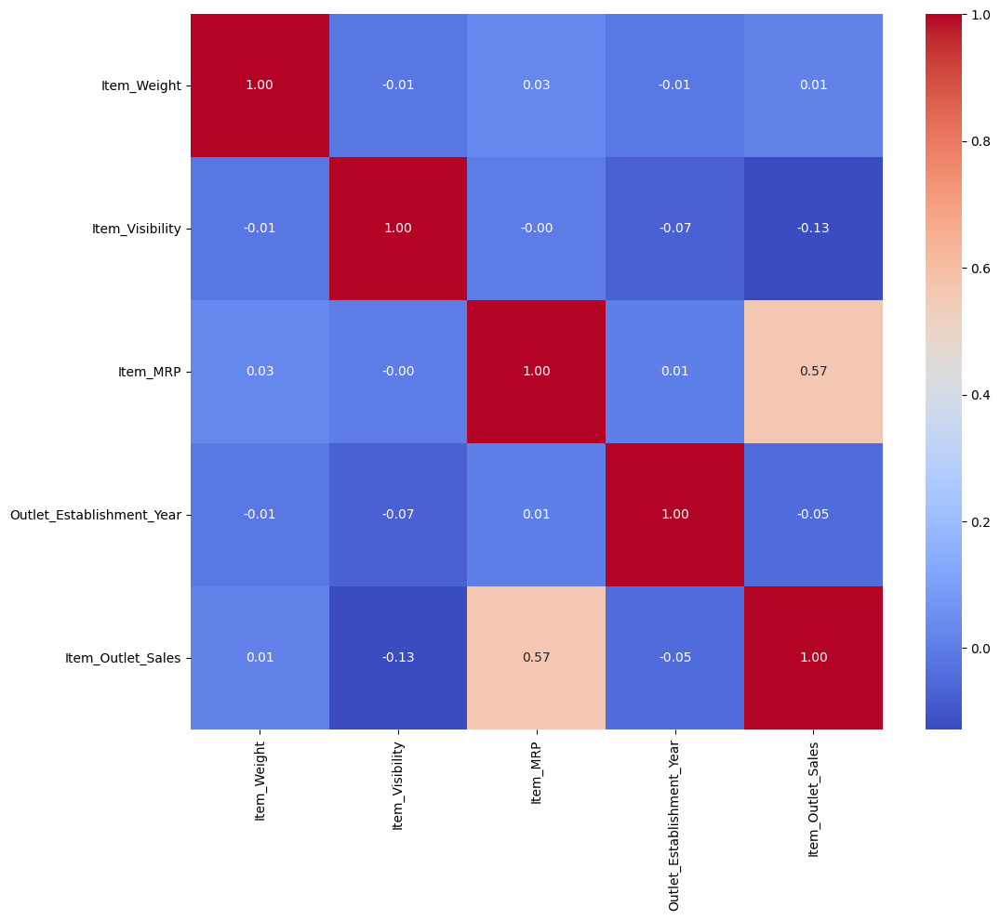

In [14]:
# Correlation analysis
numeric_df = train.select_dtypes(include=[np.number])
plt.figure(figsize=(12, 10))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', fmt='.2f')

1. **Item_MRP** has a moderate positive correlation with **Item_Outlet_Sales**. This indicates that higher MRP (Maximum Retail Price) is associated with higher sales.

2. **Item_Visibility** has a weak negative correlation with **Item_Outlet_Sales**, suggesting that items with higher visibility may not necessarily have higher sales.

3. **Outlet_Establishment_Year** has a very weak or negligible correlation with **Item_Outlet_Sales**, implying that the year of establishment of the outlet does not significantly impact sales.

4. **Item_Weight** shows almost no correlation with **Item_Outlet_Sales**, indicating that the weight of the item does not influence sales significantly.

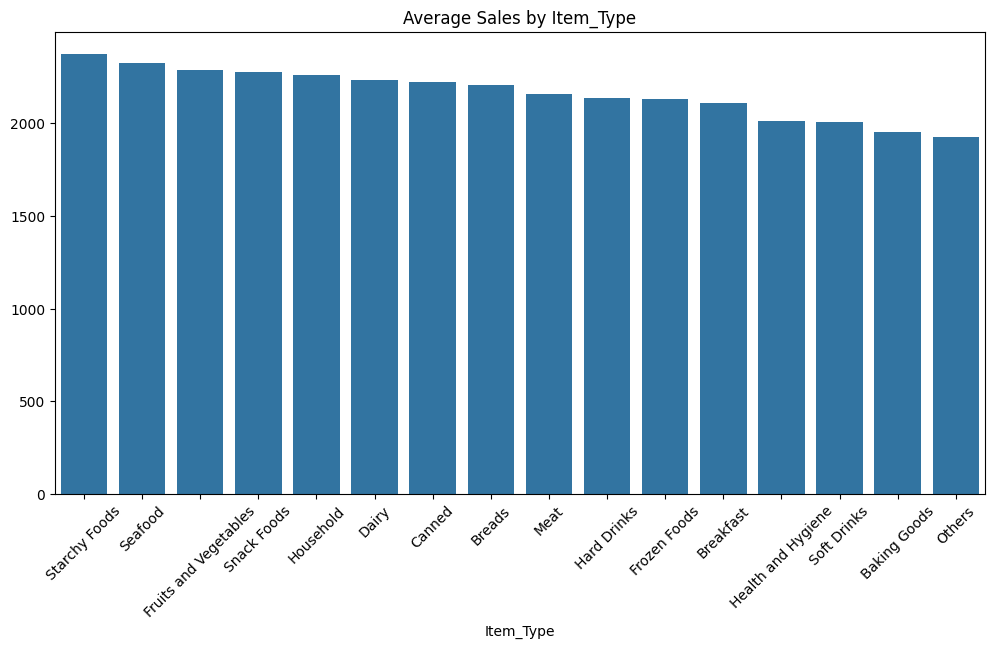

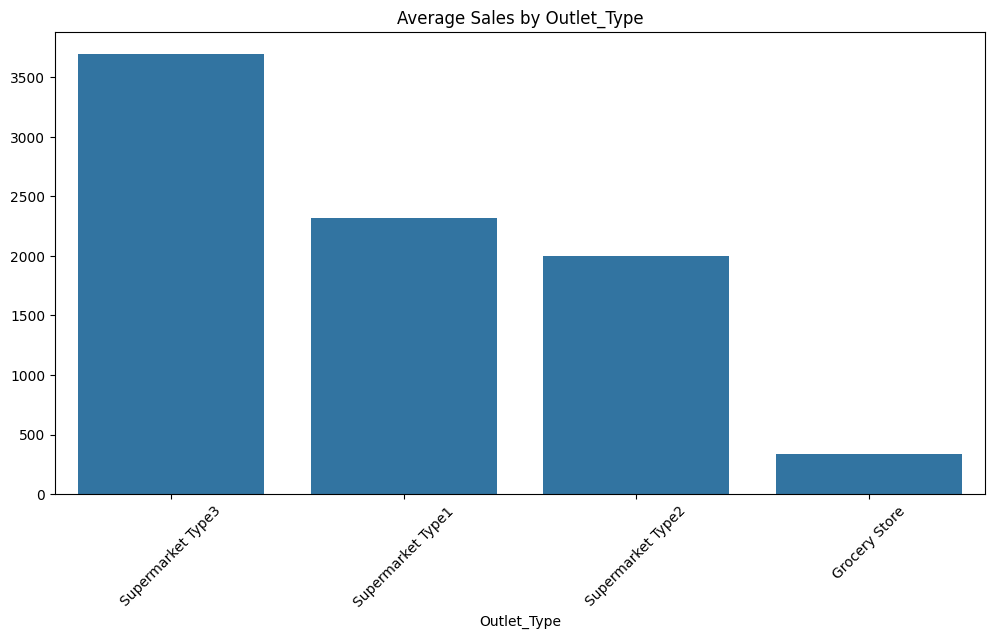

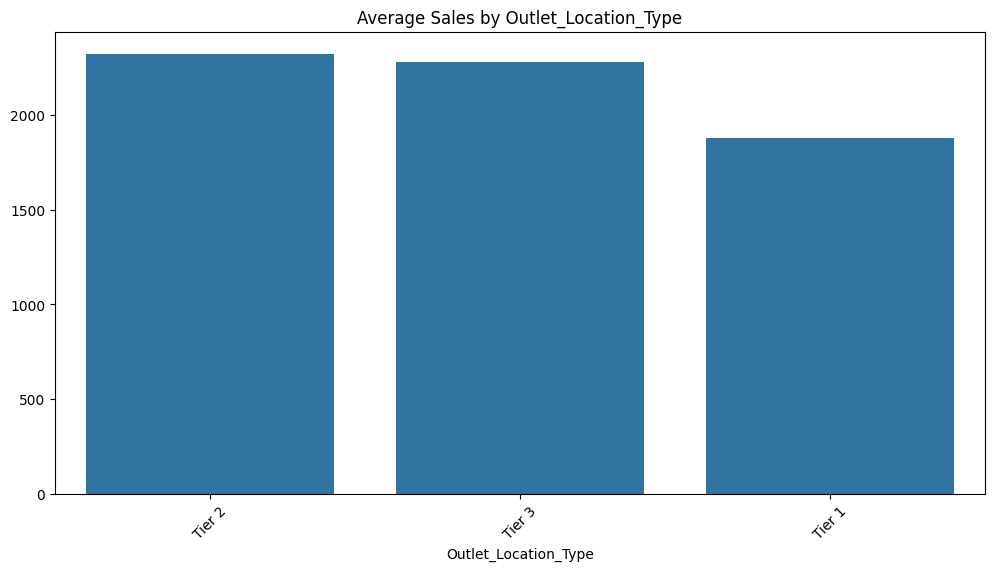

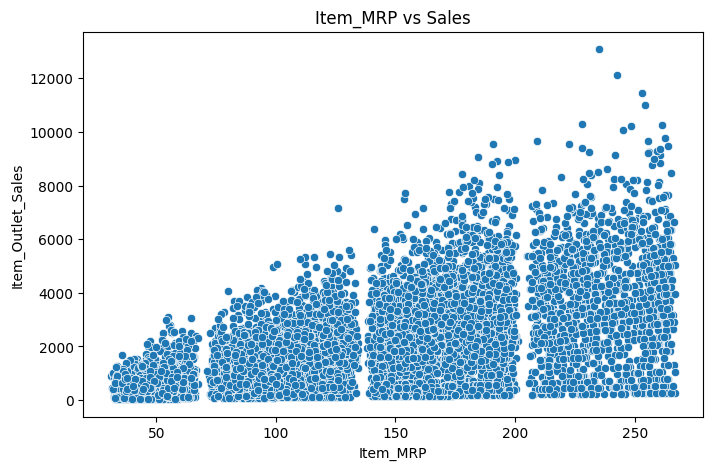

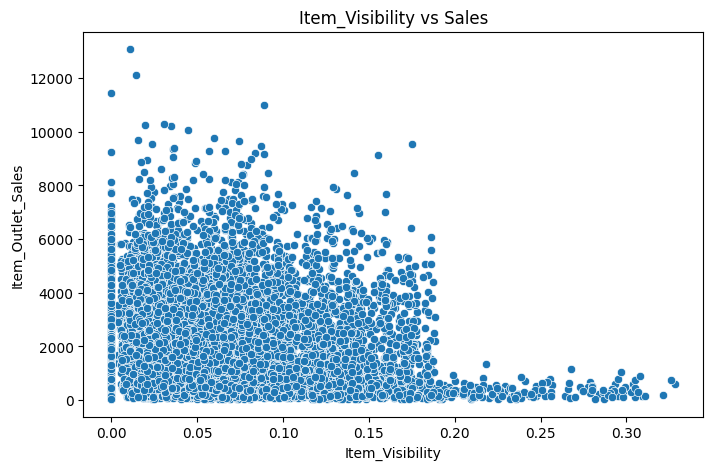

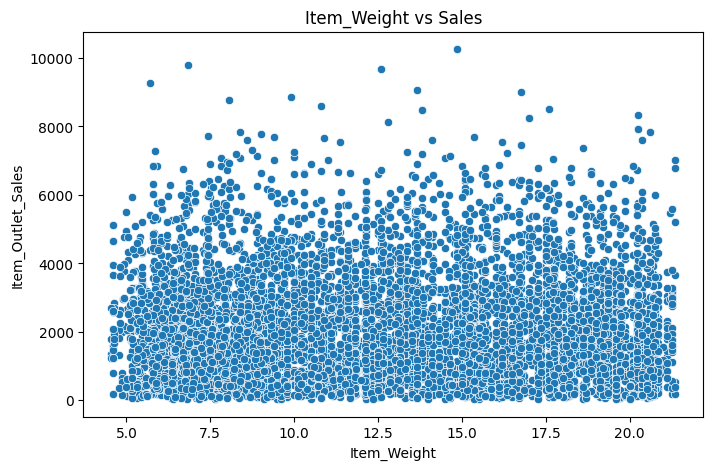

In [15]:
# Categorical variable analysis
for col in ['Item_Type', 'Outlet_Type', 'Outlet_Location_Type']:
    plt.figure(figsize=(12, 6))
    sns.barplot(x=train.groupby(col)['Item_Outlet_Sales'].mean().sort_values(ascending=False).index,
                y=train.groupby(col)['Item_Outlet_Sales'].mean().sort_values(ascending=False).values)
    plt.title(f'Average Sales by {col}')
    plt.xticks(rotation=45)

# Numerical variables vs target
for col in ['Item_MRP', 'Item_Visibility', 'Item_Weight']:
    plt.figure(figsize=(8, 5))
    sns.scatterplot(x=col, y='Item_Outlet_Sales', data=train)
    plt.title(f'{col} vs Sales')

1. **Average Sales by Categorical Variables**:
    - **Item_Type**: Certain item types, such as "Health and Hygiene" and "Household," have higher average sales compared to others like "Soft Drinks" and "Baking Goods."
    - **Outlet_Type**: Supermarket Type3 has the highest average sales, while Grocery Stores have the lowest.
    - **Outlet_Location_Type**: Outlets in Tier 3 locations have higher average sales compared to Tier 1 and Tier 2 locations.

2. **Numerical Variables vs Target**:
    - **Item_MRP vs Sales**: There is a positive relationship between Item_MRP and Item_Outlet_Sales, indicating that items with higher MRP tend to have higher sales.
    - **Item_Visibility vs Sales**: There is a weak negative relationship, suggesting that higher visibility does not necessarily lead to higher sales.
    - **Item_Weight vs Sales**: No clear trend is observed, indicating that Item_Weight does not significantly influence sales.

# Data Cleaning

### Addressing null values

In [16]:
train.isnull().sum()/train.shape[0] * 100

Item_Identifier               0.000000
Item_Weight                  17.165317
Item_Fat_Content              0.000000
Item_Visibility               0.000000
Item_Type                     0.000000
Item_MRP                      0.000000
Outlet_Identifier             0.000000
Outlet_Establishment_Year     0.000000
Outlet_Size                  28.276428
Outlet_Location_Type          0.000000
Outlet_Type                   0.000000
Item_Outlet_Sales             0.000000
dtype: float64

In [17]:
test.isnull().sum()/test.shape[0] * 100

Item_Identifier               0.000000
Item_Weight                  17.180074
Item_Fat_Content              0.000000
Item_Visibility               0.000000
Item_Type                     0.000000
Item_MRP                      0.000000
Outlet_Identifier             0.000000
Outlet_Establishment_Year     0.000000
Outlet_Size                  28.269671
Outlet_Location_Type          0.000000
Outlet_Type                   0.000000
dtype: float64

We have 17% records missing for feature Item_Weight and around 28% records missing for feature Outlet_Size and the value remains same for test as well

In [18]:
# Create pivot table and extract the values as a Series
item_avg_weight = train.pivot_table(values='Item_Weight', index='Item_Identifier')['Item_Weight']
missing_weight = train['Item_Weight'].isnull()
train.loc[missing_weight, 'Item_Weight'] = train.loc[missing_weight, 'Item_Identifier'].map(item_avg_weight)

In [19]:
outlet_sizes = train.groupby('Outlet_Type')['Outlet_Size'].apply(
        lambda x: x.mode()[0] if not x.mode().empty else "Medium")
outlet_sizes

Outlet_Type
Grocery Store         Small
Supermarket Type1     Small
Supermarket Type2    Medium
Supermarket Type3    Medium
Name: Outlet_Size, dtype: object

In [ ]:
for outlet_type, size in outlet_sizes.items():
    train.loc[(train['Outlet_Size'].isnull()) &
            (train['Outlet_Type'] == outlet_type), 'Outlet_Size'] = size

train['Outlet_Size'].fillna('Medium', inplace=True)

In [21]:
zero_visibility = train['Item_Visibility'] == 0
visibility_by_type = train.loc[~zero_visibility].pivot_table(
    values='Item_Visibility',
    index='Item_Type',
    aggfunc='median'
)
# Extract the values as a Series
visibility_by_type = visibility_by_type['Item_Visibility']
# Now map the values
train.loc[zero_visibility, 'Item_Visibility'] = train.loc[zero_visibility, 'Item_Type'].map(visibility_by_type)

In [22]:
zero_visibility = test['Item_Visibility'] == 0
visibility_by_type = test.loc[~zero_visibility].pivot_table(
    values='Item_Visibility',
    index='Item_Type',
    aggfunc='median'
)
# Extract the values as a Series
visibility_by_type = visibility_by_type['Item_Visibility']
# Now map the values
test.loc[zero_visibility, 'Item_Visibility'] = test.loc[zero_visibility, 'Item_Type'].map(visibility_by_type)

In [23]:
train.isnull().sum()/train.shape[0] * 100   

Item_Identifier              0.000000
Item_Weight                  0.046932
Item_Fat_Content             0.000000
Item_Visibility              0.000000
Item_Type                    0.000000
Item_MRP                     0.000000
Outlet_Identifier            0.000000
Outlet_Establishment_Year    0.000000
Outlet_Size                  0.000000
Outlet_Location_Type         0.000000
Outlet_Type                  0.000000
Item_Outlet_Sales            0.000000
dtype: float64

In [24]:
# Create pivot table and extract the values as a Series
item_avg_weight = test.pivot_table(values='Item_Weight', index='Item_Identifier')['Item_Weight']
missing_weight = test['Item_Weight'].isnull()
test.loc[missing_weight, 'Item_Weight'] = test.loc[missing_weight, 'Item_Identifier'].map(item_avg_weight)

In [25]:
outlet_sizes = test.groupby('Outlet_Type')['Outlet_Size'].apply(
        lambda x: x.mode()[0] if not x.mode().empty else "Medium")
for outlet_type, size in outlet_sizes.items():
    test.loc[(test['Outlet_Size'].isnull()) &
            (test['Outlet_Type'] == outlet_type), 'Outlet_Size'] = size

# Handle any remaining missing Outlet_Size
test['Outlet_Size'].fillna('Medium', inplace=True)

In [26]:
train['Item_Fat_Content'] = train['Item_Fat_Content'].replace({
    'LF': 'Low Fat',
    'low fat': 'Low Fat',
    'reg': 'Regular'
})
test['Item_Fat_Content'] = test['Item_Fat_Content'].replace({
    'LF': 'Low Fat',
    'low fat': 'Low Fat',
    'reg': 'Regular'
})

# Feature Engineering

In [27]:
Item_Identifier_lis = train['Item_Identifier'].unique()
set([i[:2] for i in Item_Identifier_lis])

{'DR', 'FD', 'NC'}

In [28]:
# Item category from identifier prefix
train['Item_Category'] = train['Item_Identifier'].apply(lambda x: x[:2])
train['Item_Category'] = train['Item_Category'].map({
    'FD': 'Food',
    'DR': 'Drinks',
    'NC': 'Non-Consumable'
})

In [29]:
# Item category from identifier prefix
test['Item_Category'] = test['Item_Identifier'].apply(lambda x: x[:2])
test['Item_Category'] = test['Item_Category'].map({
    'FD': 'Food',
    'DR': 'Drinks',
    'NC': 'Non-Consumable'
})

In [30]:
# Store age
train['Outlet_Years'] = 2013 - train['Outlet_Establishment_Year']
test['Outlet_Years'] = 2013 - test['Outlet_Establishment_Year']

In [31]:
# Price tiers - advanced percentile-based approach
train['Price_Tier'] = pd.qcut(train['Item_MRP'], 5, labels=['Very Low', 'Low', 'Medium', 'High', 'Premium'])

In [32]:
test['Price_Tier'] = pd.qcut(test['Item_MRP'], 5, labels=['Very Low', 'Low', 'Medium', 'High', 'Premium'])

In [33]:
# Item Type Groups (simplify categories)
perishable = ['Fruits and Vegetables', 'Meat', 'Seafood', 'Breakfast', 'Dairy']
non_perishable = ['Baking Goods', 'Canned', 'Frozen Foods', 'Hard Drinks', 'Soft Drinks', 'Snack Foods']

train['Item_Type_Grouped'] = train['Item_Type'].apply(
    lambda x: 'Perishable' if x in perishable else
                ('Non-Perishable' if x in non_perishable else 'Non-Food'))
test['Item_Type_Grouped'] = test['Item_Type'].apply(
    lambda x: 'Perishable' if x in perishable else
                ('Non-Perishable' if x in non_perishable else 'Non-Food'))

In [34]:
# Outlet combinations
train['Outlet_Size_x_Location'] = train['Outlet_Size'] + "_" + train['Outlet_Location_Type']
train['Outlet_Size_x_Type'] = train['Outlet_Size'] + "_" + train['Outlet_Type']

train['Outlet_Location_x_Type'] = train['Outlet_Location_Type'] + "_" + train['Outlet_Type']

test['Outlet_Size_x_Location'] = test['Outlet_Size'] + "_" + test['Outlet_Location_Type']
test['Outlet_Size_x_Type'] = test['Outlet_Size'] + "_" + test['Outlet_Type']
test['Outlet_Location_x_Type'] = test['Outlet_Location_Type'] + "_" + test['Outlet_Type']

In [35]:
# Item Type performance metrics
item_type_stats_train = train.groupby('Item_Type').agg({
    'Item_Visibility': 'mean',
    'Item_MRP': 'mean'
})
item_type_stats_train

,Item_Visibility,Item_MRP
Item_Type,,
Baking Goods,0.073499,126.380766
Breads,0.070227,140.952669
Breakfast,0.087607,141.788151
Canned,0.070846,139.763832
Dairy,0.076193,148.499208
Frozen Foods,0.069403,138.503366
Fruits and Vegetables,0.072664,144.581235
Hard Drinks,0.070053,137.077928
Health and Hygiene,0.058171,130.818921


In [36]:
# Flatten multi-index columns
item_type_stats_train.columns = [str(col)+"_mean" for col in item_type_stats_train.columns.values]
item_type_stats_train = item_type_stats_train.reset_index()

In [37]:
item_type_stats_train.head(2)

,Item_Type,Item_Visibility_mean,Item_MRP_mean
0,Baking Goods,0.073499,126.380766
1,Breads,0.070227,140.952669


In [38]:
# Item Type performance metrics
item_type_stats_test = test.groupby('Item_Type').agg({
    'Item_Visibility': 'mean',
    'Item_MRP': 'mean'
})
# Flatten multi-index columns
item_type_stats_test.columns = [str(col)+"_mean" for col in item_type_stats_test.columns.values]
item_type_stats_test = item_type_stats_test.reset_index()

In [39]:
train = pd.merge(train, item_type_stats_train, on='Item_Type', how='left')
test = pd.merge(test, item_type_stats_train, on='Item_Type', how='left')

In [40]:
train.head(1)

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,...,Item_Outlet_Sales,Item_Category,Outlet_Years,Price_Tier,Item_Type_Grouped,Outlet_Size_x_Location,Outlet_Size_x_Type,Outlet_Location_x_Type,Item_Visibility_mean,Item_MRP_mean
0,FDA15,9.3,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,...,3735.138,Food,14,Premium,Perishable,Medium_Tier 1,Medium_Supermarket Type1,Tier 1_Supermarket Type1,0.076193,148.499208


In [41]:
train['Price_Visibility_Ratio'] = train['Item_MRP'] * train['Item_Visibility']

# Relative price within category
train['Price_vs_Category_Avg'] = train['Item_MRP'] / train['Item_MRP_mean']

# Relative visibility within category
train['Visibility_vs_Category_Avg'] = train['Item_Visibility'] / train['Item_Visibility_mean']

# Age-based outlet features
train['Outlet_Age_Segment'] = pd.cut(train['Outlet_Years'],
                                    bins=[0, 10, 20, 30, 100],
                                    labels=['New', 'Established', 'Mature', 'Old'])

In [42]:
test['Price_Visibility_Ratio'] = test['Item_MRP'] * test['Item_Visibility']

# Relative price within category
test['Price_vs_Category_Avg'] = test['Item_MRP'] / test['Item_MRP_mean']

# Relative visibility within category
test['Visibility_vs_Category_Avg'] = test['Item_Visibility'] / test['Item_Visibility_mean']

# Age-based outlet features
test['Outlet_Age_Segment'] = pd.cut(test['Outlet_Years'],
                                    bins=[0, 10, 20, 30, 100],
                                    labels=['New', 'Established', 'Mature', 'Old'])

In [43]:
# Price per weight (value density)
train['Price_per_Weight'] = train['Item_MRP'] / train['Item_Weight']
test['Price_per_Weight'] = test['Item_MRP'] / test['Item_Weight']

In [44]:
# Premium item flag
train['Is_Premium'] = (train['Item_MRP'] > train['Item_MRP_mean'] * 1.2).astype(int)
test['Is_Premium'] = (test['Item_MRP'] > test['Item_MRP_mean'] * 1.2).astype(int)


In [45]:
train.shape, test.shape

((8523, 27), (5681, 26))

In [49]:
pd.set_option('display.max_columns', None)
train.head(2)

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales,Item_Category,Outlet_Years,Item_Type_Grouped,Outlet_Location_x_Type,Item_Visibility_mean,Item_MRP_mean,Price_Visibility_Ratio,Price_vs_Category_Avg,Price_per_Weight,Is_Premium
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380,Food,14,Perishable,Tier 1_Supermarket Type1,0.076193,148.499208,4.008763,1.682226,26.861204,1
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228,Drinks,4,Non-Perishable,Tier 3_Supermarket Type2,0.068067,131.492506,0.930544,0.367087,8.153581,0


Droping some of the columns since they did not help with the rank improvement in leaderboard

In [47]:
train = train.drop(columns=['Visibility_vs_Category_Avg', 'Outlet_Age_Segment', 'Outlet_Size_x_Location', 'Outlet_Size_x_Type', "Outlet_Size_x_Location", "Price_Tier"])
test = test.drop(columns=['Visibility_vs_Category_Avg', 'Outlet_Age_Segment', 'Outlet_Size_x_Location', 'Outlet_Size_x_Type', "Outlet_Size_x_Location", "Price_Tier"])

# train test split

In [50]:
y = train['Item_Outlet_Sales']

In [51]:
# Drop unnecessary columns
exclude_cols = ['Item_Outlet_Sales']
X = train.drop(exclude_cols, axis=1)

In [52]:
train.shape, test.shape

((8523, 22), (5681, 21))

In [53]:
# Split data
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, random_state=42)

In [54]:
# Identify column types
categorical_cols = X.select_dtypes(include=['object', 'category']).columns.tolist()
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Create preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='median'))
            # ('scaler', StandardScaler())
        ]), numerical_cols),
        ('cat', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='most_frequent')),
            ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
        ]), categorical_cols)
    ])

# Modelling

In [55]:
models = {
        'Linear Regression': Pipeline([
            ('preprocessor', preprocessor),
            ('regressor', LinearRegression())
        ]),
        'Ridge': Pipeline([
            ('preprocessor', preprocessor),
            ('regressor', Ridge(alpha=1.0))
        ]),
        'Lasso': Pipeline([
            ('preprocessor', preprocessor),
            ('regressor', Lasso(alpha=0.001))
        ]),
        'ElasticNet': Pipeline([
            ('preprocessor', preprocessor),
            ('regressor', ElasticNet(alpha=0.01, l1_ratio=0.5))
        ]),
        'Random Forest': Pipeline([
            ('preprocessor', preprocessor),
            ('regressor', RandomForestRegressor(n_estimators=100, random_state=42))
        ]),
        'Gradient Boosting': Pipeline([
            ('preprocessor', preprocessor),
            ('regressor', GradientBoostingRegressor(n_estimators=100, random_state=42))
        ]),
        # 'XGBoost': Pipeline([
        #     ('preprocessor', preprocessor),
        #     ('regressor', XGBRegressor(n_estimators=100, random_state=42))
        # ]),
        'LightGBM': Pipeline([
            ('preprocessor', preprocessor),
            ('regressor', LGBMRegressor(n_estimators=100, random_state=42))
        ])
    }

In [56]:
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((6392, 21), (2131, 21), (6392,), (2131,))

In [57]:
results = []

# Evaluate each model
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_val)

    rmse = np.sqrt(mean_squared_error(y_val, y_pred))
    r2 = r2_score(y_val, y_pred)

    results.append({
        'Model': name,
        'RMSE': rmse,
        'R²': r2
    })

    print(f"{name}: RMSE = {rmse:.2f}, R² = {r2:.4f}")

res_df =  pd.DataFrame(results).sort_values('RMSE')

Linear Regression: RMSE = 1280.08, R² = 0.4061
Ridge: RMSE = 1191.84, R² = 0.4851
Lasso: RMSE = 1273.23, R² = 0.4124
ElasticNet: RMSE = 1093.27, R² = 0.5668
Random Forest: RMSE = 1100.15, R² = 0.5613
Gradient Boosting: RMSE = 1059.75, R² = 0.5929
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1665
[LightGBM] [Info] Number of data points in the train set: 6392, number of used features: 62
[LightGBM] [Info] Start training from score 2209.979359
LightGBM: RMSE = 1073.72, R² = 0.5821


In [58]:
X_train.head(2)

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Category,Outlet_Years,Item_Type_Grouped,Outlet_Location_x_Type,Item_Visibility_mean,Item_MRP_mean,Price_Visibility_Ratio,Price_vs_Category_Avg,Price_per_Weight,Is_Premium
4776,NCG06,16.35,Low Fat,0.029565,Household,256.4646,OUT018,2009,Medium,Tier 3,Supermarket Type2,Non-Consumable,4,Non-Food,Tier 3_Supermarket Type2,0.064069,149.424753,7.582455,1.716346,15.685908,1
7510,FDV57,15.25,Regular,0.057584,Snack Foods,179.7660,OUT018,2009,Medium,Tier 3,Supermarket Type2,Food,4,Non-Perishable,Tier 3_Supermarket Type2,0.070113,146.194934,10.351598,1.229632,11.787934,1


In [59]:
# X_train = X_train.drop(columns=['Item_Fat_Content', 'Item_Visibility', 'Item_Visibility_mean', 'Price_Visibility_Ratio', 'Visibility_vs_Category_Avg'])
# X_val = X_val.drop(columns=['Item_Fat_Content', 'Item_Visibility', 'Item_Visibility_mean', 'Price_Visibility_Ratio', 'Visibility_vs_Category_Avg'])
# X_test = test.drop(columns=['Item_Fat_Content', 'Item_Visibility', 'Item_Visibility_mean', 'Price_Visibility_Ratio', 'Visibility_vs_Category_Avg'])

In [60]:
from catboost import CatBoostRegressor
categorical_features = None
if isinstance(X_train, pd.DataFrame):
    categorical_features = [i for i, col in enumerate(X_train.columns)
                            if X_train[col].dtype == 'object' or X_train[col].dtype.name == 'category']
cat_model = CatBoostRegressor(iterations=500, learning_rate=0.01, depth=6,\
                          loss_function='RMSE', cat_features=list(categorical_features),nan_mode='Min')
# fit the model on the training data
cat_model.fit(X_train, y_train, eval_set=(X_val, y_val), logging_level='Silent',plot=True)

# make predictions on the test set
y_pred = cat_model.predict(X_val)

# evaluate the model
from sklearn.metrics import mean_squared_error
rmse = np.sqrt(mean_squared_error(y_val, y_pred))
print("RMSE: ", rmse)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

RMSE:  1039.905767419863


In [61]:
r2 = r2_score(y_val, y_pred)
r2

0.6080417153514177

In [62]:
sub_test = pd.read_csv(r"/home/aifruaduser/Hayagriva/whatsapp_agent/Big_mart_sales/Data/test_AbJTz2l.csv")

In [64]:
y_pred = cat_model.predict(test)
res_submission = pd.DataFrame(columns=["Item_Identifier","Outlet_Identifier","Item_Outlet_Sales"])
res_submission["Item_Identifier"] = sub_test["Item_Identifier"]
res_submission["Outlet_Identifier"] = sub_test["Outlet_Identifier"]

res_submission["Item_Outlet_Sales"] = y_pred
res_submission.to_csv(r"/home/aifruaduser/Hayagriva/whatsapp_agent/Big_mart_sales/Data/submission_catag_v5.csv", index=False)

# Gradient Boosting

In [65]:
train.shape, test.shape

((8523, 22), (5681, 21))

In [66]:
train.head(2)

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales,Item_Category,Outlet_Years,Item_Type_Grouped,Outlet_Location_x_Type,Item_Visibility_mean,Item_MRP_mean,Price_Visibility_Ratio,Price_vs_Category_Avg,Price_per_Weight,Is_Premium
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380,Food,14,Perishable,Tier 1_Supermarket Type1,0.076193,148.499208,4.008763,1.682226,26.861204,1
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228,Drinks,4,Non-Perishable,Tier 3_Supermarket Type2,0.068067,131.492506,0.930544,0.367087,8.153581,0


In [67]:
test.shape, train.shape

((5681, 21), (8523, 22))

In [68]:
sub_test = pd.read_csv(r"/home/aifruaduser/Hayagriva/whatsapp_agent/Big_mart_sales/Data/test_AbJTz2l.csv")

In [69]:
from sklearn.linear_model import LassoCV

gradient_model = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', GradientBoostingRegressor(n_estimators=100, random_state=42))
])
gradient_model.fit(X_train, y_train)

y_pred = gradient_model.predict(test)
y_pred = [np.absolute(i) for i in y_pred]
res_submission = pd.DataFrame(columns=["Item_Identifier","Outlet_Identifier","Item_Outlet_Sales"])
res_submission["Item_Identifier"] = sub_test["Item_Identifier"]
res_submission["Outlet_Identifier"] = test["Outlet_Identifier"]

res_submission["Item_Outlet_Sales"] = y_pred
res_submission.to_csv(r"/home/aifruaduser/Hayagriva/whatsapp_agent/Big_mart_sales/Data/submission_gradient_v2.csv", index=False)

In [70]:
from catboost import CatBoostRegressor
import optuna


In [71]:
def tune_lightgbm_optuna(X_train, y_train, X_test, y_test, preprocessor=None, n_trials=100):
    """
    LightGBM tuning using Optuna for efficient hyperparameter optimization.
    """
    print("Starting LightGBM Optuna Optimization...")

    # If preprocessor is provided, preprocess the data
    if preprocessor:
        X_train_processed = preprocessor.transform(X_train)
        X_test_processed = preprocessor.transform(X_test)
    else:
        X_train_processed = X_train
        X_test_processed = X_test

    # Create Optuna study
    def objective(trial):
        params = {
            'objective': 'regression',
            'metric': 'rmse',
            'boosting_type': trial.suggest_categorical('boosting_type', ['gbdt', 'dart', 'goss']),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
            'n_estimators': trial.suggest_int('n_estimators', 50, 1000),
            'max_depth': trial.suggest_int('max_depth', 3, 12),
            'num_leaves': trial.suggest_int('num_leaves', 20, 150),
            'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            # Changed to avoid log(0) issue - using small positive value instead of 0.0
            'reg_alpha': trial.suggest_float('reg_alpha', 1e-8, 10.0, log=True),
            'reg_lambda': trial.suggest_float('reg_lambda', 1e-8, 10.0, log=True),
            'random_state': 42
        }

        # Special handling for goss boosting
        if params['boosting_type'] == 'goss':
            params.pop('subsample')

        # Create and train model
        model = LGBMRegressor(**params)

        # Cross validation
        cv_scores = cross_val_score(
            model,
            X_train_processed,
            y_train,
            cv=5,
            scoring='neg_root_mean_squared_error'
        )

        return -np.mean(cv_scores)  # Return negative RMSE for minimization

    # Create and optimize study
    study = optuna.create_study(direction='minimize')
    study.optimize(objective, n_trials=n_trials)

    # Get best parameters
    best_params = study.best_params
    best_params['objective'] = 'regression'
    best_params['metric'] = 'rmse'
    best_params['random_state'] = 42

    print(f"Best parameters: {best_params}")
    print(f"Best RMSE: {study.best_value:.4f}")

    # Train model with best parameters
    best_model = LGBMRegressor(**best_params)
    best_model.fit(X_train_processed, y_train)

    # Evaluate on test set
    y_pred = best_model.predict(X_test_processed)
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    test_r2 = r2_score(y_test, y_pred)

    print(f"Test RMSE: {test_rmse:.4f}")
    print(f"Test R²: {test_r2:.4f}")

    return best_model, best_params

In [72]:
lgbm_model, lgbm_params = tune_lightgbm_optuna(X_train, y_train, X_val, y_val, preprocessor)

[I 2025-04-30 07:46:47,266] A new study created in memory with name: no-name-8f2d9dd8-73ea-401d-8a27-afe33fd769e1


Starting LightGBM Optuna Optimization...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1660
[LightGBM] [Info] Number of data points in the train set: 5113, number of used features: 61
[LightGBM] [Info] Start training from score 2220.464617
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:46:52,157] Trial 0 finished with value: 1122.752115830805 and parameters: {'boosting_type': 'dart', 'learning_rate': 0.08916782495238233, 'n_estimators': 344, 'max_depth': 12, 'num_leaves': 102, 'min_child_samples': 64, 'subsample': 0.7560601911698346, 'colsample_bytree': 0.8698829916740657, 'reg_alpha': 0.001489251294777413, 'reg_lambda': 4.8797169858917154e-05}. Best is trial 0 with value: 1122.752115830805.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1658
[LightGBM] [Info] Number of data points in the train set: 5113, number of used features: 60
[LightGBM] [Info] Start training from score 2220.464617
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2025-04-30 07:46:53,666] Trial 1 finished with value: 1165.6151952638277 and parameters: {'boosting_type': 'gbdt', 'learning_rate': 0.09251959198291852, 'n_estimators': 815, 'max_depth': 6, 'num_leaves': 87, 'min_child_samples': 88, 'subsample': 0.6720427622507897, 'colsample_bytree': 0.8075069293744008, 'reg_alpha': 1.0735529303325127e-07, 'reg_lambda': 4.43546239102835}. Best is trial 0 with value: 1122.752115830805.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:46:54,190] Trial 2 finished with value: 1242.2031380692465 and parameters: {'boosting_type': 'dart', 'learning_rate': 0.0812448943555244, 'n_estimators': 65, 'max_depth': 8, 'num_leaves': 134, 'min_child_samples': 87, 'subsample': 0.7344302544877082, 'colsample_bytree': 0.8828095811195016, 'reg_alpha': 3.5817409281953704e-06, 'reg_lambda': 2.120440129206363e-05}. Best is trial 0 with value: 1122.752115830805.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1658
[LightGBM] [Info] Number of data points in the train set: 5114, number of used features: 60
[LightGBM] [Info] Start training from score 2209.317736
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2025-04-30 07:46:56,757] Trial 3 finished with value: 1207.093308746814 and parameters: {'boosting_type': 'gbdt', 'learning_rate': 0.05870588815498674, 'n_estimators': 608, 'max_depth': 12, 'num_leaves': 106, 'min_child_samples': 22, 'subsample': 0.8682202222271117, 'colsample_bytree': 0.5375727632280173, 'reg_alpha': 5.5507034697825715, 'reg_lambda': 0.04021224281755645}. Best is trial 0 with value: 1122.752115830805.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:46:57,454] Trial 4 finished with value: 1120.16633605956 and parameters: {'boosting_type': 'gbdt', 'learning_rate': 0.06719641884189792, 'n_estimators': 434, 'max_depth': 4, 'num_leaves': 72, 'min_child_samples': 74, 'subsample': 0.704362626915932, 'colsample_bytree': 0.7431152252592074, 'reg_alpha': 0.26188369200222195, 'reg_lambda': 1.0910806690819689e-07}. Best is trial 4 with value: 1120.16633605956.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:05,438] Trial 5 finished with value: 1131.898345634081 and parameters: {'boosting_type': 'dart', 'learning_rate': 0.17873090559233842, 'n_estimators': 569, 'max_depth': 8, 'num_leaves': 113, 'min_child_samples': 88, 'subsample': 0.7003415141732665, 'colsample_bytree': 0.679581978991985, 'reg_alpha': 0.19008691214748355, 'reg_lambda': 1.191570076509198}. Best is trial 4 with value: 1120.16633605956.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000207 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1658
[LightGBM] [Info] Number of data points in the train set: 5113, number of used features: 60
[LightGBM] [Info] Start training from score 2220.464617
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2025-04-30 07:47:17,175] Trial 6 finished with value: 1113.735127261996 and parameters: {'boosting_type': 'dart', 'learning_rate': 0.07473116704319802, 'n_estimators': 951, 'max_depth': 5, 'num_leaves': 116, 'min_child_samples': 80, 'subsample': 0.8370597192354301, 'colsample_bytree': 0.5525264589776185, 'reg_alpha': 3.192769713080755e-05, 'reg_lambda': 1.0332815834492801}. Best is trial 6 with value: 1113.735127261996.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:17,666] Trial 7 finished with value: 1664.2814561368564 and parameters: {'boosting_type': 'dart', 'learning_rate': 0.019452261643089722, 'n_estimators': 66, 'max_depth': 9, 'num_leaves': 30, 'min_child_samples': 70, 'subsample': 0.5372661578162257, 'colsample_bytree': 0.7404595296660004, 'reg_alpha': 9.551374223466086e-05, 'reg_lambda': 0.00032008197019341356}. Best is trial 6 with value: 1113.735127261996.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1662
[LightGBM] [Info] Number of data points in the train set: 5114, number of used features: 60
[LightGBM] [Info] Start training from score 2192.992226
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000209 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1658
[LightGBM] [Info] Number of data points in the train set: 5113, number of used features: 60
[LightGBM] [Info] Start training from score 2220.464617
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

[I 2025-04-30 07:47:18,871] Trial 8 finished with value: 1196.9208937484163 and parameters: {'boosting_type': 'gbdt', 'learning_rate': 0.17392010803175986, 'n_estimators': 538, 'max_depth': 8, 'num_leaves': 31, 'min_child_samples': 97, 'subsample': 0.6151473431357047, 'colsample_bytree': 0.8866001536326472, 'reg_alpha': 3.8512038782333275e-08, 'reg_lambda': 0.00135046189636611}. Best is trial 6 with value: 1113.735127261996.


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1662
[LightGBM] [Info] Number of data points in the train set: 5113, number of used features: 62
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] Start training from score 2220.464617
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-04-30 07:47:20,653] Trial 9 finished with value: 1141.0255919084623 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.04267721349378001, 'n_estimators': 872, 'max_depth': 4, 'num_leaves': 41, 'min_child_samples': 13, 'subsample': 0.7905314545325349, 'colsample_bytree': 0.8624057986088371, 'reg_alpha': 3.814935083492508e-06, 'reg_lambda': 5.5853759247873186e-05}. Best is trial 6 with value: 1113.735127261996.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:22,233] Trial 10 finished with value: 1100.7032967678651 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.01861355720882169, 'n_estimators': 996, 'max_depth': 3, 'num_leaves': 145, 'min_child_samples': 40, 'subsample': 0.9882050761252323, 'colsample_bytree': 0.5174397488017348, 'reg_alpha': 0.0017855097349560147, 'reg_lambda': 0.021668313338957832}. Best is trial 10 with value: 1100.7032967678651.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:23,781] Trial 11 finished with value: 1095.0134488732306 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.010776454051281291, 'n_estimators': 979, 'max_depth': 3, 'num_leaves': 149, 'min_child_samples': 32, 'subsample': 0.9831023067350662, 'colsample_bytree': 0.5017979337482292, 'reg_alpha': 0.0005830532848795703, 'reg_lambda': 0.03038345987241161}. Best is trial 11 with value: 1095.0134488732306.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:25,382] Trial 12 finished with value: 1096.3707494967116 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.011094508769641334, 'n_estimators': 997, 'max_depth': 3, 'num_leaves': 149, 'min_child_samples': 38, 'subsample': 0.9419847414143997, 'colsample_bytree': 0.6150995264692033, 'reg_alpha': 0.003925391218226686, 'reg_lambda': 0.023663606559746597}. Best is trial 11 with value: 1095.0134488732306.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:26,628] Trial 13 finished with value: 1093.590375422635 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.010745131050321169, 'n_estimators': 746, 'max_depth': 3, 'num_leaves': 147, 'min_child_samples': 39, 'subsample': 0.9707196777941524, 'colsample_bytree': 0.6322328077819397, 'reg_alpha': 0.018788013090207827, 'reg_lambda': 0.019116860173967982}. Best is trial 13 with value: 1093.590375422635.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:28,621] Trial 14 finished with value: 1099.7454902905833 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.010375355609985527, 'n_estimators': 732, 'max_depth': 6, 'num_leaves': 130, 'min_child_samples': 46, 'subsample': 0.9046119396563687, 'colsample_bytree': 0.6266382477452923, 'reg_alpha': 0.038229461726412235, 'reg_lambda': 0.0032143800901467496}. Best is trial 13 with value: 1093.590375422635.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:31,719] Trial 15 finished with value: 1157.6832520274083 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.02582537817673737, 'n_estimators': 774, 'max_depth': 10, 'num_leaves': 64, 'min_child_samples': 27, 'subsample': 0.996935063622286, 'colsample_bytree': 0.610461661528561, 'reg_alpha': 0.021344938532430725, 'reg_lambda': 1.0851875784740363e-06}. Best is trial 13 with value: 1093.590375422635.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:33,552] Trial 16 finished with value: 1123.451228389528 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.032088029206977196, 'n_estimators': 687, 'max_depth': 6, 'num_leaves': 126, 'min_child_samples': 55, 'subsample': 0.9379394111480881, 'colsample_bytree': 0.9586715118447291, 'reg_alpha': 4.099312824956018, 'reg_lambda': 0.1029980571151191}. Best is trial 13 with value: 1093.590375422635.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:34,261] Trial 17 finished with value: 1091.440804219082 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.015297235156175806, 'n_estimators': 272, 'max_depth': 4, 'num_leaves': 150, 'min_child_samples': 27, 'subsample': 0.825939492981133, 'colsample_bytree': 0.6783925798836472, 'reg_alpha': 0.0003210184540708306, 'reg_lambda': 0.003705871404992497}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:35,065] Trial 18 finished with value: 1095.8303722401558 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.01530131311828595, 'n_estimators': 241, 'max_depth': 5, 'num_leaves': 87, 'min_child_samples': 17, 'subsample': 0.823202887472841, 'colsample_bytree': 0.6794212760316132, 'reg_alpha': 1.2610037162197396e-05, 'reg_lambda': 3.2290054068573535e-06}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:35,803] Trial 19 finished with value: 1097.614196881959 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.028708722817891528, 'n_estimators': 209, 'max_depth': 4, 'num_leaves': 136, 'min_child_samples': 6, 'subsample': 0.8937407128715059, 'colsample_bytree': 0.7003146571930405, 'reg_alpha': 5.274316115768494e-07, 'reg_lambda': 0.0026586580008225863}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:36,911] Trial 20 finished with value: 1096.3340459804872 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.017071418785202668, 'n_estimators': 433, 'max_depth': 5, 'num_leaves': 120, 'min_child_samples': 55, 'subsample': 0.616731171194553, 'colsample_bytree': 0.814423607454676, 'reg_alpha': 0.0001888361723501516, 'reg_lambda': 0.2969333148781157}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1664
[LightGBM] [Info] Number of data points in the train set: 5114, number of used features: 61
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] Start training from score 2192.992226
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-30 07:47:38,359] Trial 21 finished with value: 1094.6983030846 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.011778609826006934, 'n_estimators': 898, 'max_depth': 3, 'num_leaves': 150, 'min_child_samples': 35, 'subsample': 0.9435747450183343, 'colsample_bytree': 0.5837715453723453, 'reg_alpha': 0.001150098967575898, 'reg_lambda': 0.00749852000495821}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:39,479] Trial 22 finished with value: 1094.6647627210118 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.014081828674727683, 'n_estimators': 651, 'max_depth': 3, 'num_leaves': 137, 'min_child_samples': 33, 'subsample': 0.9362116790150865, 'colsample_bytree': 0.5822948193978581, 'reg_alpha': 0.0252569545130645, 'reg_lambda': 0.0006932395062030356}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:40,814] Trial 23 finished with value: 1248.3966308126119 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.2939667100303488, 'n_estimators': 636, 'max_depth': 4, 'num_leaves': 138, 'min_child_samples': 45, 'subsample': 0.8542329793014858, 'colsample_bytree': 0.6455970930838206, 'reg_alpha': 0.01822171340920626, 'reg_lambda': 0.0002609393200734236}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:41,588] Trial 24 finished with value: 1092.1972410568626 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.014228367369892263, 'n_estimators': 411, 'max_depth': 3, 'num_leaves': 98, 'min_child_samples': 27, 'subsample': 0.7923181198528433, 'colsample_bytree': 0.5710083129570441, 'reg_alpha': 0.14834351787085318, 'reg_lambda': 0.00042477055014040305}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1666
[LightGBM] [Info] Number of data points in the train set: 5114, number of used features: 62
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] Start training from score 2192.992226
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-30 07:47:42,809] Trial 25 finished with value: 1107.840231484522 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.023482432086151583, 'n_estimators': 449, 'max_depth': 5, 'num_leaves': 100, 'min_child_samples': 24, 'subsample': 0.8070239125286407, 'colsample_bytree': 0.7042908806760787, 'reg_alpha': 0.7591095329302869, 'reg_lambda': 8.432022686893447e-06}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:43,577] Trial 26 finished with value: 1103.515634043742 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.03476115556913716, 'n_estimators': 305, 'max_depth': 4, 'num_leaves': 55, 'min_child_samples': 12, 'subsample': 0.7622210777162702, 'colsample_bytree': 0.6536661465988338, 'reg_alpha': 0.11861747262130425, 'reg_lambda': 1.3690978235880512e-08}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:44,193] Trial 27 finished with value: 1102.605865676738 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.04405770238103337, 'n_estimators': 144, 'max_depth': 7, 'num_leaves': 73, 'min_child_samples': 47, 'subsample': 0.8864459518581214, 'colsample_bytree': 0.5710789361733724, 'reg_alpha': 0.0058870980912004755, 'reg_lambda': 0.0001962432999213569}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:44,764] Trial 28 finished with value: 1093.0777476438818 and parameters: {'boosting_type': 'gbdt', 'learning_rate': 0.02165469196751672, 'n_estimators': 365, 'max_depth': 3, 'num_leaves': 122, 'min_child_samples': 30, 'subsample': 0.7940246476576022, 'colsample_bytree': 0.7840778981382464, 'reg_alpha': 0.8036937604156565, 'reg_lambda': 0.006334489384446605}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1662
[LightGBM] [Info] Number of data points in the train set: 5114, number of used features: 62
[LightGBM] [Info] Start training from score 2209.317736
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2025-04-30 07:47:46,391] Trial 29 finished with value: 1109.2579392957239 and parameters: {'boosting_type': 'gbdt', 'learning_rate': 0.013958431065038182, 'n_estimators': 327, 'max_depth': 11, 'num_leaves': 100, 'min_child_samples': 62, 'subsample': 0.7587277630423879, 'colsample_bytree': 0.8200503894800047, 'reg_alpha': 1.488399439326706, 'reg_lambda': 6.692079924878913e-05}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:47,223] Trial 30 finished with value: 1094.196799821219 and parameters: {'boosting_type': 'gbdt', 'learning_rate': 0.022422039956324327, 'n_estimators': 379, 'max_depth': 4, 'num_leaves': 94, 'min_child_samples': 5, 'subsample': 0.7857932331007644, 'colsample_bytree': 0.7733531343741865, 'reg_alpha': 0.9708194899686676, 'reg_lambda': 0.17949447971523427}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:47,702] Trial 31 finished with value: 1094.101397683035 and parameters: {'boosting_type': 'gbdt', 'learning_rate': 0.013211276346346175, 'n_estimators': 251, 'max_depth': 3, 'num_leaves': 122, 'min_child_samples': 28, 'subsample': 0.7258572839044911, 'colsample_bytree': 0.7132512442397302, 'reg_alpha': 0.05795829978089555, 'reg_lambda': 0.005389246136930506}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:48,407] Trial 32 finished with value: 1095.9076088748177 and parameters: {'boosting_type': 'gbdt', 'learning_rate': 0.01948540975635231, 'n_estimators': 481, 'max_depth': 3, 'num_leaves': 142, 'min_child_samples': 20, 'subsample': 0.6639536769288483, 'colsample_bytree': 0.7798501250380931, 'reg_alpha': 0.39281202299649176, 'reg_lambda': 0.0007631366266600864}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:49,129] Trial 33 finished with value: 1093.770186801397 and parameters: {'boosting_type': 'gbdt', 'learning_rate': 0.016036496750799302, 'n_estimators': 355, 'max_depth': 4, 'num_leaves': 109, 'min_child_samples': 41, 'subsample': 0.84213534360508, 'colsample_bytree': 0.6505929386215769, 'reg_alpha': 0.006643712886613987, 'reg_lambda': 0.008639894486698125}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:50,436] Trial 34 finished with value: 1490.222592113109 and parameters: {'boosting_type': 'dart', 'learning_rate': 0.021095664975633314, 'n_estimators': 172, 'max_depth': 6, 'num_leaves': 130, 'min_child_samples': 29, 'subsample': 0.7788473458582821, 'colsample_bytree': 0.5991735496855044, 'reg_alpha': 8.248132060714626, 'reg_lambda': 4.93903434516681}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:51,438] Trial 35 finished with value: 1095.2605249844448 and parameters: {'boosting_type': 'gbdt', 'learning_rate': 0.010016752767232245, 'n_estimators': 403, 'max_depth': 5, 'num_leaves': 123, 'min_child_samples': 51, 'subsample': 0.7316415395229414, 'colsample_bytree': 0.5441096791022632, 'reg_alpha': 0.07266102591466006, 'reg_lambda': 0.07077413825583805}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:47:52,594] Trial 36 finished with value: 1192.6968536969853 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.10906089604195862, 'n_estimators': 287, 'max_depth': 7, 'num_leaves': 78, 'min_child_samples': 19, 'subsample': 0.8154930678216106, 'colsample_bytree': 0.7282878864539098, 'reg_alpha': 2.3778472083007585, 'reg_lambda': 0.0015674855187184354}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1662
[LightGBM] [Info] Number of data points in the train set: 5113, number of used features: 62
[LightGBM] [Info] Start training from score 2220.464617
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

[I 2025-04-30 07:47:55,857] Trial 37 finished with value: 1323.7249274631745 and parameters: {'boosting_type': 'dart', 'learning_rate': 0.01319560596048342, 'n_estimators': 522, 'max_depth': 3, 'num_leaves': 110, 'min_child_samples': 24, 'subsample': 0.6889256143945212, 'colsample_bytree': 0.7726049943233234, 'reg_alpha': 0.35108255079927164, 'reg_lambda': 0.5779247058778014}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1662
[LightGBM] [Info] Number of data points in the train set: 5113, number of used features: 62
[LightGBM] [Info] Start training from score 2220.464617
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2025-04-30 07:47:56,691] Trial 38 finished with value: 1112.513333542011 and parameters: {'boosting_type': 'gbdt', 'learning_rate': 0.04008986490655918, 'n_estimators': 501, 'max_depth': 4, 'num_leaves': 142, 'min_child_samples': 35, 'subsample': 0.8688945497552956, 'colsample_bytree': 0.6787916816327904, 'reg_alpha': 8.739784834718467e-05, 'reg_lambda': 2.000496558325977e-05}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1664
[LightGBM] [Info] Number of data points in the train set: 5114, number of used features: 61
[LightGBM] [Info] Start training from score 2192.992226
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2025-04-30 07:48:03,696] Trial 39 finished with value: 1132.127738739296 and parameters: {'boosting_type': 'dart', 'learning_rate': 0.02736456975904949, 'n_estimators': 587, 'max_depth': 5, 'num_leaves': 117, 'min_child_samples': 13, 'subsample': 0.6452400075809328, 'colsample_bytree': 0.8506329881240662, 'reg_alpha': 4.705353502300229e-07, 'reg_lambda': 0.012044939745199079}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:04,152] Trial 40 finished with value: 1093.6848951210836 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.05120243471693195, 'n_estimators': 119, 'max_depth': 4, 'num_leaves': 93, 'min_child_samples': 41, 'subsample': 0.5127122679846033, 'colsample_bytree': 0.9651481499289654, 'reg_alpha': 0.15471705691163043, 'reg_lambda': 0.00011962478466213725}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:04,587] Trial 41 finished with value: 1095.5024051357088 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.055959179293142564, 'n_estimators': 108, 'max_depth': 4, 'num_leaves': 88, 'min_child_samples': 30, 'subsample': 0.507892608114435, 'colsample_bytree': 0.9790943355540608, 'reg_alpha': 0.2195295777890023, 'reg_lambda': 0.000180827424578498}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:05,207] Trial 42 finished with value: 1110.9297296425277 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.10196818173323306, 'n_estimators': 266, 'max_depth': 3, 'num_leaves': 93, 'min_child_samples': 40, 'subsample': 0.5658136064890675, 'colsample_bytree': 0.9189042090996428, 'reg_alpha': 0.011503323758994209, 'reg_lambda': 0.0005881306581117771}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:05,549] Trial 43 finished with value: 1207.6470837920547 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.018048474592637236, 'n_estimators': 54, 'max_depth': 4, 'num_leaves': 105, 'min_child_samples': 50, 'subsample': 0.7234703273777509, 'colsample_bytree': 0.9287847670123536, 'reg_alpha': 0.10185040216449881, 'reg_lambda': 0.00010513122607146779}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1660
[LightGBM] [Info] Number of data points in the train set: 5114, number of used features: 61
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] Start training from score 2209.317736
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-30 07:48:06,062] Trial 44 finished with value: 1108.062282417599 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.12709380022156178, 'n_estimators': 189, 'max_depth': 3, 'num_leaves': 129, 'min_child_samples': 59, 'subsample': 0.5602384068098466, 'colsample_bytree': 0.563806216870036, 'reg_alpha': 0.002747224856193141, 'reg_lambda': 1.4338631092525287e-05}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1658
[LightGBM] [Info] Number of data points in the train set: 5114, number of used features: 60
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] Start training from score 2209.317736
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-04-30 07:48:06,774] Trial 45 finished with value: 1091.9594223543818 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.012350944066319891, 'n_estimators': 357, 'max_depth': 3, 'num_leaves': 80, 'min_child_samples': 37, 'subsample': 0.7582774389192919, 'colsample_bytree': 0.6321450256805644, 'reg_alpha': 0.7093188733153785, 'reg_lambda': 0.001733435049000337}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:08,577] Trial 46 finished with value: 1112.972410116717 and parameters: {'boosting_type': 'gbdt', 'learning_rate': 0.012111112783475023, 'n_estimators': 369, 'max_depth': 9, 'num_leaves': 64, 'min_child_samples': 24, 'subsample': 0.750512072232964, 'colsample_bytree': 0.5271856065274187, 'reg_alpha': 0.5596078960856284, 'reg_lambda': 0.002102081250854146}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:09,394] Trial 47 finished with value: 1093.2898233876367 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.017174334537647856, 'n_estimators': 414, 'max_depth': 3, 'num_leaves': 81, 'min_child_samples': 36, 'subsample': 0.7003882209493102, 'colsample_bytree': 0.627410950416856, 'reg_alpha': 3.043741817615654, 'reg_lambda': 0.05244903417408415}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1664
[LightGBM] [Info] Number of data points in the train set: 5114, number of used features: 61
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] Start training from score 2192.992226
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-04-30 07:48:11,785] Trial 48 finished with value: 1329.702679683311 and parameters: {'boosting_type': 'dart', 'learning_rate': 0.016048188575482753, 'n_estimators': 415, 'max_depth': 3, 'num_leaves': 75, 'min_child_samples': 70, 'subsample': 0.6995461470489013, 'colsample_bytree': 0.6582465725540627, 'reg_alpha': 2.698600197842325, 'reg_lambda': 1.3407704406216316}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:12,694] Trial 49 finished with value: 1097.5328859254457 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.023886812235014772, 'n_estimators': 470, 'max_depth': 3, 'num_leaves': 82, 'min_child_samples': 17, 'subsample': 0.7961237844797527, 'colsample_bytree': 0.7514652546815102, 'reg_alpha': 1.1825828313798619, 'reg_lambda': 0.048085794705438535}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1666
[LightGBM] [Info] Number of data points in the train set: 5114, number of used features: 62
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] Start training from score 2192.992226
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-04-30 07:48:13,902] Trial 50 finished with value: 1098.104775858986 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.01950737096060332, 'n_estimators': 550, 'max_depth': 5, 'num_leaves': 65, 'min_child_samples': 99, 'subsample': 0.7733026360489563, 'colsample_bytree': 0.6208264478641639, 'reg_alpha': 7.851266591559135, 'reg_lambda': 0.004373997794682533}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:14,608] Trial 51 finished with value: 1092.6795558430895 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.011536922016877196, 'n_estimators': 342, 'max_depth': 3, 'num_leaves': 50, 'min_child_samples': 36, 'subsample': 0.8319967843555879, 'colsample_bytree': 0.5991705724758132, 'reg_alpha': 4.164432015664083, 'reg_lambda': 0.017834507370058747}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:15,266] Trial 52 finished with value: 1092.6674602657142 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.015129514187983981, 'n_estimators': 315, 'max_depth': 3, 'num_leaves': 21, 'min_child_samples': 36, 'subsample': 0.8276679987621709, 'colsample_bytree': 0.5963496079691653, 'reg_alpha': 3.5194046287385423, 'reg_lambda': 0.019137675925599788}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:16,014] Trial 53 finished with value: 1092.4156551146993 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.012104995360773977, 'n_estimators': 328, 'max_depth': 3, 'num_leaves': 22, 'min_child_samples': 32, 'subsample': 0.8309320454782525, 'colsample_bytree': 0.5952543290770086, 'reg_alpha': 7.7476987687954475, 'reg_lambda': 0.016238989732404504}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:16,837] Trial 54 finished with value: 1092.7806661197724 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.011575833226093181, 'n_estimators': 333, 'max_depth': 4, 'num_leaves': 21, 'min_child_samples': 26, 'subsample': 0.8390543899317722, 'colsample_bytree': 0.5929354010498604, 'reg_alpha': 9.90066689817351, 'reg_lambda': 0.01819880692560898}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:17,489] Trial 55 finished with value: 1093.9814087842767 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.014533678601918995, 'n_estimators': 310, 'max_depth': 3, 'num_leaves': 42, 'min_child_samples': 43, 'subsample': 0.8626352286548667, 'colsample_bytree': 0.5010682781531572, 'reg_alpha': 1.2227831572723178e-08, 'reg_lambda': 0.0010368733754389221}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1662
[LightGBM] [Info] Number of data points in the train set: 5113, number of used features: 62
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] Start training from score 2220.464617
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-04-30 07:48:18,088] Trial 56 finished with value: 1096.7030898542412 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.012934977312873085, 'n_estimators': 212, 'max_depth': 4, 'num_leaves': 39, 'min_child_samples': 32, 'subsample': 0.8253340870490572, 'colsample_bytree': 0.5567646583327074, 'reg_alpha': 2.503092660728925, 'reg_lambda': 0.12405770404704099}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:18,731] Trial 57 finished with value: 1098.4994761343496 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.011667702886628011, 'n_estimators': 263, 'max_depth': 3, 'num_leaves': 20, 'min_child_samples': 35, 'subsample': 0.9213248496919058, 'colsample_bytree': 0.6030004074101009, 'reg_alpha': 4.61678688930777, 'reg_lambda': 0.0004062028863311778}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:19,363] Trial 58 finished with value: 1097.9984225707656 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.010035549684007201, 'n_estimators': 294, 'max_depth': 3, 'num_leaves': 29, 'min_child_samples': 21, 'subsample': 0.8816654767625522, 'colsample_bytree': 0.6719981762156042, 'reg_alpha': 1.7439039733411335, 'reg_lambda': 0.002139821647856379}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:19,981] Trial 59 finished with value: 1092.8505918316057 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.015224606064281812, 'n_estimators': 239, 'max_depth': 4, 'num_leaves': 49, 'min_child_samples': 92, 'subsample': 0.8071431864886729, 'colsample_bytree': 0.5745569117135514, 'reg_alpha': 6.880659898003974e-06, 'reg_lambda': 0.015542385644382886}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:21,094] Trial 60 finished with value: 1155.7917939552133 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.07007953696713022, 'n_estimators': 399, 'max_depth': 5, 'num_leaves': 26, 'min_child_samples': 9, 'subsample': 0.8476533345591227, 'colsample_bytree': 0.5288397994276767, 'reg_alpha': 0.0007788228383962478, 'reg_lambda': 0.3514288030095763}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1662
[LightGBM] [Info] Number of data points in the train set: 5113, number of used features: 62
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] Start training from score 2220.464617
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-04-30 07:48:21,925] Trial 61 finished with value: 1092.597549264794 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.011981805783327396, 'n_estimators': 332, 'max_depth': 4, 'num_leaves': 22, 'min_child_samples': 24, 'subsample': 0.8360612486902953, 'colsample_bytree': 0.592290309487536, 'reg_alpha': 7.031838931601678, 'reg_lambda': 0.003950522811069152}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:22,791] Trial 62 finished with value: 1092.0038689333542 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.012186502685849003, 'n_estimators': 336, 'max_depth': 4, 'num_leaves': 35, 'min_child_samples': 38, 'subsample': 0.8282036965839397, 'colsample_bytree': 0.6379922996112692, 'reg_alpha': 4.4844050795916255, 'reg_lambda': 0.028435240745846486}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:23,805] Trial 63 finished with value: 1100.8031696713945 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.012880185903248636, 'n_estimators': 225, 'max_depth': 12, 'num_leaves': 35, 'min_child_samples': 32, 'subsample': 0.8764062780325871, 'colsample_bytree': 0.6390849128810572, 'reg_alpha': 5.553504022873185, 'reg_lambda': 0.003799481591369395}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:24,830] Trial 64 finished with value: 1095.3908527208457 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.014545753845851427, 'n_estimators': 444, 'max_depth': 4, 'num_leaves': 24, 'min_child_samples': 16, 'subsample': 0.810553102372862, 'colsample_bytree': 0.6145911880423033, 'reg_alpha': 0.510285729397286, 'reg_lambda': 0.032749423951553516}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:25,790] Trial 65 finished with value: 1098.9443602820227 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.017384348725777404, 'n_estimators': 328, 'max_depth': 5, 'num_leaves': 33, 'min_child_samples': 26, 'subsample': 0.9025154377294978, 'colsample_bytree': 0.6643707941842416, 'reg_alpha': 1.3988259345475254, 'reg_lambda': 0.0011306247610595966}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:26,690] Trial 66 finished with value: 1092.4921322658383 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.010919367058859292, 'n_estimators': 391, 'max_depth': 4, 'num_leaves': 28, 'min_child_samples': 45, 'subsample': 0.7716771245919167, 'colsample_bytree': 0.5865533225610726, 'reg_alpha': 0.8421264153443017, 'reg_lambda': 0.007952335021997322}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:27,836] Trial 67 finished with value: 1095.3198061859146 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.010832460023154637, 'n_estimators': 377, 'max_depth': 6, 'num_leaves': 27, 'min_child_samples': 48, 'subsample': 0.7415233742182278, 'colsample_bytree': 0.5437676979988998, 'reg_alpha': 0.24775687159079626, 'reg_lambda': 0.007798178013635179}. Best is trial 17 with value: 1091.440804219082.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:28,550] Trial 68 finished with value: 1091.4095210443327 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.012897368069905912, 'n_estimators': 279, 'max_depth': 4, 'num_leaves': 37, 'min_child_samples': 54, 'subsample': 0.769886724017945, 'colsample_bytree': 0.69211783256676, 'reg_alpha': 0.7796550543950819, 'reg_lambda': 0.0003332984226292393}. Best is trial 68 with value: 1091.4095210443327.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=

[I 2025-04-30 07:48:29,728] Trial 69 finished with value: 1098.2836904954486 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.020195145748811316, 'n_estimators': 466, 'max_depth': 5, 'num_leaves': 38, 'min_child_samples': 56, 'subsample': 0.7695437467680735, 'colsample_bytree': 0.7081176603247781, 'reg_alpha': 0.05405086257891684, 'reg_lambda': 0.00032236575707574744}. Best is trial 68 with value: 1091.4095210443327.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:30,773] Trial 70 finished with value: 1096.4795487187262 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.013375932363923647, 'n_estimators': 276, 'max_depth': 7, 'num_leaves': 47, 'min_child_samples': 44, 'subsample': 0.7924040154810179, 'colsample_bytree': 0.6969506966574789, 'reg_alpha': 0.716432034094123, 'reg_lambda': 5.939789491270619e-05}. Best is trial 68 with value: 1091.4095210443327.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:31,723] Trial 71 finished with value: 1092.321249933138 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.012461630197365493, 'n_estimators': 388, 'max_depth': 4, 'num_leaves': 31, 'min_child_samples': 38, 'subsample': 0.8544352079571883, 'colsample_bytree': 0.6359494085377477, 'reg_alpha': 1.2746656155397014, 'reg_lambda': 0.0033302929440064822}. Best is trial 68 with value: 1091.4095210443327.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:32,618] Trial 72 finished with value: 1091.3006095664919 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.010923265328590932, 'n_estimators': 388, 'max_depth': 4, 'num_leaves': 58, 'min_child_samples': 53, 'subsample': 0.7555591929121068, 'colsample_bytree': 0.6372563474852316, 'reg_alpha': 1.1710919108162126e-06, 'reg_lambda': 0.001748440051953715}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:33,587] Trial 73 finished with value: 1091.9649818823425 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.012712077788223402, 'n_estimators': 434, 'max_depth': 4, 'num_leaves': 55, 'min_child_samples': 52, 'subsample': 0.715079060658658, 'colsample_bytree': 0.6865186346484025, 'reg_alpha': 9.559027988620369e-07, 'reg_lambda': 0.0005063419681427853}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:34,653] Trial 74 finished with value: 1095.1242853600068 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.016424695355704153, 'n_estimators': 427, 'max_depth': 5, 'num_leaves': 68, 'min_child_samples': 65, 'subsample': 0.7218761002538632, 'colsample_bytree': 0.6835160102138368, 'reg_alpha': 1.0464419368482947e-06, 'reg_lambda': 3.407235446261752e-05}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:38,548] Trial 75 finished with value: 1275.9400100217142 and parameters: {'boosting_type': 'dart', 'learning_rate': 0.013344454786454107, 'n_estimators': 493, 'max_depth': 4, 'num_leaves': 55, 'min_child_samples': 53, 'subsample': 0.7427630693395764, 'colsample_bytree': 0.7251128766772844, 'reg_alpha': 1.1133557620358494e-06, 'reg_lambda': 0.0005362449458831437}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:39,389] Trial 76 finished with value: 1091.7440444020397 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.010026054063289417, 'n_estimators': 362, 'max_depth': 4, 'num_leaves': 58, 'min_child_samples': 59, 'subsample': 0.7554391858396322, 'colsample_bytree': 0.6908182759283402, 'reg_alpha': 1.749781559892217e-05, 'reg_lambda': 0.00014995276224211257}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1664
[LightGBM] [Info] Number of data points in the train set: 5114, number of used features: 61
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] Start training from score 2192.992226
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-04-30 07:48:40,396] Trial 77 finished with value: 1091.7888457463675 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.010066036712091785, 'n_estimators': 358, 'max_depth': 5, 'num_leaves': 67, 'min_child_samples': 65, 'subsample': 0.7543707943116111, 'colsample_bytree': 0.6846983499972635, 'reg_alpha': 1.1558737037364282e-07, 'reg_lambda': 0.00013291983474815285}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:41,002] Trial 78 finished with value: 1116.2925232629063 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.010124213536126588, 'n_estimators': 179, 'max_depth': 5, 'num_leaves': 58, 'min_child_samples': 75, 'subsample': 0.6787067434166207, 'colsample_bytree': 0.6926080956408445, 'reg_alpha': 1.6279768930278499e-07, 'reg_lambda': 0.00010158608943622907}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1662
[LightGBM] [Info] Number of data points in the train set: 5114, number of used features: 60
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] Start training from score 2192.992226
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-04-30 07:48:42,016] Trial 79 finished with value: 1092.3471869763111 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.011280406730777936, 'n_estimators': 356, 'max_depth': 5, 'num_leaves': 58, 'min_child_samples': 65, 'subsample': 0.7092623895361182, 'colsample_bytree': 0.723767002527622, 'reg_alpha': 1.2825344317553027e-05, 'reg_lambda': 3.3409514561256734e-06}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:43,044] Trial 80 finished with value: 1094.2167732713654 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.010690783142221848, 'n_estimators': 293, 'max_depth': 6, 'num_leaves': 69, 'min_child_samples': 57, 'subsample': 0.7547409896506445, 'colsample_bytree': 0.7411264653833192, 'reg_alpha': 4.600910693356745e-08, 'reg_lambda': 0.0002040397057052693}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:44,087] Trial 81 finished with value: 1092.8524912360515 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.013924039092432967, 'n_estimators': 453, 'max_depth': 4, 'num_leaves': 61, 'min_child_samples': 62, 'subsample': 0.7828004902476737, 'colsample_bytree': 0.6642857512774283, 'reg_alpha': 5.5706422879198243e-05, 'reg_lambda': 3.5435467103687817e-05}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1664
[LightGBM] [Info] Number of data points in the train set: 5114, number of used features: 61
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] Start training from score 2192.992226
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-30 07:48:44,927] Trial 82 finished with value: 1199.2522110076145 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.29757842161436215, 'n_estimators': 356, 'max_depth': 4, 'num_leaves': 46, 'min_child_samples': 59, 'subsample': 0.7354790086926014, 'colsample_bytree': 0.6447501651099925, 'reg_alpha': 1.8551079330595245e-07, 'reg_lambda': 0.0008256911924057093}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000268 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1664
[LightGBM] [Info] Number of data points in the train set: 5114, number of used features: 61
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] Start training from score 2192.992226
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-04-30 07:48:46,055] Trial 83 finished with value: 1093.7777217183782 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.015677400928275433, 'n_estimators': 510, 'max_depth': 4, 'num_leaves': 53, 'min_child_samples': 69, 'subsample': 0.7616422874947433, 'colsample_bytree': 0.6877875053082321, 'reg_alpha': 1.839142975813691e-06, 'reg_lambda': 0.0016166755770736202}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:46,989] Trial 84 finished with value: 1094.1794496626012 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.0182124978761294, 'n_estimators': 409, 'max_depth': 4, 'num_leaves': 44, 'min_child_samples': 53, 'subsample': 0.79461876604446, 'colsample_bytree': 0.7575619812513755, 'reg_alpha': 0.0002359340328203043, 'reg_lambda': 0.00036892040205659213}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1664
[LightGBM] [Info] Number of data points in the train set: 5114, number of used features: 61
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] Start training from score 2192.992226
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-04-30 07:48:48,167] Trial 85 finished with value: 1093.2045178930448 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.010015975323029919, 'n_estimators': 433, 'max_depth': 5, 'num_leaves': 70, 'min_child_samples': 49, 'subsample': 0.7498553352301625, 'colsample_bytree': 0.6551176021478767, 'reg_alpha': 3.738383240008712e-07, 'reg_lambda': 0.00014810525435486298}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:49,160] Trial 86 finished with value: 1095.9527546668044 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.014277345624166094, 'n_estimators': 249, 'max_depth': 9, 'num_leaves': 75, 'min_child_samples': 68, 'subsample': 0.7184127749803376, 'colsample_bytree': 0.7114219262944477, 'reg_alpha': 2.057190907026492e-05, 'reg_lambda': 0.000257544039451642}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:53,906] Trial 87 finished with value: 1139.8215842701666 and parameters: {'boosting_type': 'dart', 'learning_rate': 0.2551129880789726, 'n_estimators': 373, 'max_depth': 10, 'num_leaves': 60, 'min_child_samples': 78, 'subsample': 0.8050311223751679, 'colsample_bytree': 0.6734162423183103, 'reg_alpha': 5.094196135930584e-06, 'reg_lambda': 0.0005410553050197444}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:55,093] Trial 88 finished with value: 1092.4223616456798 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.010995396543947942, 'n_estimators': 543, 'max_depth': 4, 'num_leaves': 67, 'min_child_samples': 59, 'subsample': 0.6622829906587466, 'colsample_bytree': 0.6243568919836303, 'reg_alpha': 7.385333370967141e-08, 'reg_lambda': 6.917226190105653e-05}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:55,738] Trial 89 finished with value: 1093.3366968479902 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.012396841469697203, 'n_estimators': 307, 'max_depth': 3, 'num_leaves': 52, 'min_child_samples': 67, 'subsample': 0.7784688834316849, 'colsample_bytree': 0.7173998320987321, 'reg_alpha': 2.3260744110251523e-06, 'reg_lambda': 0.0010287518020652986}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:56,343] Trial 90 finished with value: 1092.079851788711 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.01652906707874283, 'n_estimators': 277, 'max_depth': 3, 'num_leaves': 90, 'min_child_samples': 62, 'subsample': 0.7136889524324114, 'colsample_bytree': 0.6967132879819149, 'reg_alpha': 3.369969770015811e-07, 'reg_lambda': 6.516148707916643e-06}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:57,081] Trial 91 finished with value: 1093.0811758709242 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.013841834226703011, 'n_estimators': 282, 'max_depth': 3, 'num_leaves': 87, 'min_child_samples': 62, 'subsample': 0.6911392504529695, 'colsample_bytree': 0.6892960431917509, 'reg_alpha': 3.1732210634304655e-07, 'reg_lambda': 9.661806339176385e-07}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:57,876] Trial 92 finished with value: 1092.1620562622472 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.015854566440454194, 'n_estimators': 350, 'max_depth': 3, 'num_leaves': 95, 'min_child_samples': 51, 'subsample': 0.7342347507178129, 'colsample_bytree': 0.6651063844110084, 'reg_alpha': 8.069323316200321e-07, 'reg_lambda': 1.013241784639179e-07}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1664
[LightGBM] [Info] Number of data points in the train set: 5114, number of used features: 61
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] Start training from score 2192.992226
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-30 07:48:58,477] Trial 93 finished with value: 1096.9446694636713 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.012588393727489903, 'n_estimators': 206, 'max_depth': 4, 'num_leaves': 80, 'min_child_samples': 52, 'subsample': 0.709326494875164, 'colsample_bytree': 0.6645012600432145, 'reg_alpha': 7.43401145333599e-07, 'reg_lambda': 9.100070507587848e-07}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1664
[LightGBM] [Info] Number of data points in the train set: 5114, number of used features: 61
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] Start training from score 2192.992226
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-30 07:48:59,180] Trial 94 finished with value: 1092.0634569820238 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.01583427105756905, 'n_estimators': 342, 'max_depth': 3, 'num_leaves': 90, 'min_child_samples': 72, 'subsample': 0.736576807110474, 'colsample_bytree': 0.6973181110211621, 'reg_alpha': 1.7048123730503145e-08, 'reg_lambda': 1.2428688234775803e-07}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:48:59,789] Trial 95 finished with value: 1092.1120342727495 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.018749046623938875, 'n_estimators': 264, 'max_depth': 3, 'num_leaves': 84, 'min_child_samples': 63, 'subsample': 0.7165452492279597, 'colsample_bytree': 0.7025295844587336, 'reg_alpha': 1.860739464315659e-08, 'reg_lambda': 1.2985109988542557e-07}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:49:00,282] Trial 96 finished with value: 1093.1991211006134 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.030944595183541337, 'n_estimators': 150, 'max_depth': 4, 'num_leaves': 90, 'min_child_samples': 83, 'subsample': 0.7655182836744734, 'colsample_bytree': 0.6460575674661302, 'reg_alpha': 3.114881154465711e-08, 'reg_lambda': 5.822841720685386e-06}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-30 07:49:01,227] Trial 97 finished with value: 1097.9274514095662 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.011699168206268814, 'n_estimators': 230, 'max_depth': 8, 'num_leaves': 63, 'min_child_samples': 75, 'subsample': 0.7496805868671977, 'colsample_bytree': 0.7352590596430775, 'reg_alpha': 1.9196238501596956e-07, 'reg_lambda': 4.5048841654306896e-07}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1662
[LightGBM] [Info] Number of data points in the train set: 5114, number of used features: 60
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] Start training from score 2192.992226
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-04-30 07:49:01,892] Trial 98 finished with value: 1095.5635328462981 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.01089709962898148, 'n_estimators': 308, 'max_depth': 3, 'num_leaves': 71, 'min_child_samples': 71, 'subsample': 0.646699027057636, 'colsample_bytree': 0.678306614759462, 'reg_alpha': 1.1507130559965936e-07, 'reg_lambda': 1.468246425882075e-08}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1660
[LightGBM] [Info] Number of data points in the train set: 5113, number of used features: 61
[LightGBM

[I 2025-04-30 07:49:02,698] Trial 99 finished with value: 1092.4288021998332 and parameters: {'boosting_type': 'goss', 'learning_rate': 0.0168085200690464, 'n_estimators': 338, 'max_depth': 4, 'num_leaves': 77, 'min_child_samples': 73, 'subsample': 0.7338394303128154, 'colsample_bytree': 0.634149628540607, 'reg_alpha': 6.272366115517906e-08, 'reg_lambda': 1.2289953358324e-05}. Best is trial 72 with value: 1091.3006095664919.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [73]:
lgbm_params

{'boosting_type': 'goss',
 'learning_rate': 0.010923265328590932,
 'n_estimators': 388,
 'max_depth': 4,
 'num_leaves': 58,
 'min_child_samples': 53,
 'subsample': 0.7555591929121068,
 'colsample_bytree': 0.6372563474852316,
 'reg_alpha': 1.1710919108162126e-06,
 'reg_lambda': 0.001748440051953715,
 'objective': 'regression',
 'metric': 'rmse',
 'random_state': 42}

In [74]:
res_hyper = []

In [99]:
X_val_processed = preprocessor.transform(X_val)
lgbm_preds_1 = lgbm_model.predict(X_val_processed)

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.


In [76]:
lgbm_rmse = np.sqrt(mean_squared_error(y_val, lgbm_preds))
lgbm_r2 = r2_score(y_val, lgbm_preds)

In [77]:
lgbm_rmse, lgbm_r2

(1037.187829216675, 0.610087912709709)

In [78]:
X_test = test.copy()

In [79]:
# Predict with best lgbm
if preprocessor:
    X_test_processed = preprocessor.transform(X_test)
    lgbm_preds = lgbm_model.predict(X_test_processed)

lgbm_preds

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.


array([1647.22254233, 1438.79485551,  777.73962334, ..., 1964.42590231,
       3558.4162407 , 1345.48587391])

In [80]:
# test = pd.read_csv(r"/home/aifruaduser/Hayagriva/whatsapp_agent/Big_mart_sales/Data/test_AbJTz2l.csv")


In [81]:
lgbm_preds

array([1647.22254233, 1438.79485551,  777.73962334, ..., 1964.42590231,
       3558.4162407 , 1345.48587391])

In [82]:
res_submission = pd.DataFrame(columns=["Item_Identifier","Outlet_Identifier","Item_Outlet_Sales"])
res_submission["Item_Identifier"] = sub_test["Item_Identifier"]
res_submission["Outlet_Identifier"] = sub_test["Outlet_Identifier"]

res_submission["Item_Outlet_Sales"] = lgbm_preds
res_submission["Item_Outlet_Sales"] = [np.absolute(i) if i < 0 else i for i in res_submission["Item_Outlet_Sales"]]
res_submission.to_csv(r"/home/aifruaduser/Hayagriva/whatsapp_agent/Big_mart_sales/Data/submission_lgb_v9.csv", index=False)

In [83]:
train.head(2)

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales,Item_Category,Outlet_Years,Item_Type_Grouped,Outlet_Location_x_Type,Item_Visibility_mean,Item_MRP_mean,Price_Visibility_Ratio,Price_vs_Category_Avg,Price_per_Weight,Is_Premium
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380,Food,14,Perishable,Tier 1_Supermarket Type1,0.076193,148.499208,4.008763,1.682226,26.861204,1
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228,Drinks,4,Non-Perishable,Tier 3_Supermarket Type2,0.068067,131.492506,0.930544,0.367087,8.153581,0


In [84]:
X_test_processed.shape, X_test.shape

((5681, 1612), (5681, 21))

In [85]:
# After training with tune_lightgbm_optuna
# lgbm_model, lgbm_params = tune_lightgbm_optuna(X_train, y_train, X_val, y_val, preprocessor)

# Get transformed feature names from the ColumnTransformer
def get_feature_names_from_column_transformer(column_transformer):
    feature_names = []

    # Process each transformer
    for name, pipe, cols in column_transformer.transformers_:
        if name == 'num':
            # For numerical columns, names stay the same after scaling
            feature_names.extend(cols)
        elif name == 'cat':
            # For categorical columns, get the one-hot encoded feature names
            encoder = pipe.named_steps['onehot']
            # Get original categories from the encoder
            if hasattr(encoder, 'get_feature_names_out'):
                # For newer scikit-learn versions
                cat_features = encoder.get_feature_names_out(cols)
            else:
                # For older scikit-learn versions
                cat_features = encoder.get_feature_names(cols)
            feature_names.extend(cat_features)

    return feature_names

# Get transformed feature names
transformed_feature_names = get_feature_names_from_column_transformer(preprocessor)

# Get feature importance from the model
importance = lgbm_model.feature_importances_

# Create DataFrame of feature importance
feature_importance = pd.DataFrame({
    'Feature': transformed_feature_names,
    'Importance': importance
})
feature_importance = feature_importance.sort_values('Importance', ascending=False)

# Display top features
print("Top Important Features:")
print(feature_importance.head(50))

Top Important Features:
                                              Feature  Importance
2                                            Item_MRP         767
8                               Price_vs_Category_Avg         602
9                                    Price_per_Weight         308
1595                        Outlet_Type_Grocery Store         308
3                           Outlet_Establishment_Year         268
0                                         Item_Weight         263
1                                     Item_Visibility         237
7                              Price_Visibility_Ratio         193
1584                         Outlet_Identifier_OUT027         191
6                                       Item_MRP_mean         135
1596                    Outlet_Type_Supermarket Type1         120
4                                        Outlet_Years         104
5                                Item_Visibility_mean         101
1598                    Outlet_Type_Supermarket Type

In [86]:
feature_importance[feature_importance["Feature"].str.contains("Perishable")].sort_values("Importance", ascending=False)

,Feature,Importance
1603,Item_Type_Grouped_Non-Perishable,36
1604,Item_Type_Grouped_Perishable,20


In [87]:
res_hyper.append({
        'Model': 'LightGBM (Tuned)',
        'RMSE': lgbm_rmse,
        'R²': lgbm_r2,
        'Parameters': lgbm_params
    })

# Cat Boost hyperparameter

In [88]:
def tune_catboost_optuna(X_train, y_train, X_test, y_test, categorical_features=None, preprocessor=None, n_trials=25):
    """
    CatBoost tuning using Optuna for efficient hyperparameter optimization.
    """
    print("Starting CatBoost Optuna Optimization...")

    # If preprocessor is provided, preprocess the data
    # if preprocessor:
    #     X_train_processed = preprocessor.transform(X_train)
    #     X_test_processed = preprocessor.transform(X_test)
    # else:
    X_train_processed = X_train
    X_test_processed = X_test

    # Create Optuna study
    def objective(trial):
        # First choose grow_policy
        grow_policy = trial.suggest_categorical('grow_policy',
                                               ['SymmetricTree', 'Depthwise', 'Lossguide'])

        # Then choose compatible boosting_type based on grow_policy
        if grow_policy == 'SymmetricTree':
            boosting_type = trial.suggest_categorical('boosting_type', ['Ordered', 'Plain'])
        else:
            # For non-symmetric trees, only Plain boosting is supported
            boosting_type = 'Plain'

        params = {
            'loss_function': 'RMSE',
            'eval_metric': 'RMSE',
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
            'iterations': trial.suggest_int('iterations', 100, 1000),
            'depth': trial.suggest_int('depth', 4, 10),
            'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 0.1, 10.0, log=True),
            'border_count': trial.suggest_int('border_count', 32, 255),
            'random_strength': trial.suggest_float('random_strength', 1e-9, 10, log=True),
            'grow_policy': grow_policy,
            'boosting_type': boosting_type,
            'bootstrap_type': trial.suggest_categorical('bootstrap_type', ['Bayesian', 'Bernoulli', 'MVS']),
            'random_seed': 42,
            'verbose': False,
            'cat_features': categorical_features
        }

        # Special handling for bootstrap types
        if params['bootstrap_type'] == 'Bayesian':
            params['bagging_temperature'] = trial.suggest_float('bagging_temperature', 0, 10)
        elif params['bootstrap_type'] == 'Bernoulli':
            params['subsample'] = trial.suggest_float('subsample', 0.1, 1)

        # Create and train model
        model = CatBoostRegressor(**params)

        # Cross validation
        cv_scores = cross_val_score(
            model,
            X_train_processed,
            y_train,
            cv=5,
            scoring='neg_root_mean_squared_error'
        )

        return -np.mean(cv_scores)  # Return negative RMSE for minimization

    # Create and optimize study
    study = optuna.create_study(direction='minimize')
    study.optimize(objective, n_trials=n_trials)

    # Rest of the function remains the same...
    best_params = study.best_params
    best_params['loss_function'] = 'RMSE'
    best_params['eval_metric'] = 'RMSE'
    best_params['random_seed'] = 42
    best_params['verbose'] = False
    best_params['cat_features'] = categorical_features

    # Make sure boosting_type is set correctly if not in best_params
    if 'boosting_type' not in best_params:
        best_params['boosting_type'] = 'Plain' if best_params['grow_policy'] != 'SymmetricTree' else 'Ordered'

    print(f"Best parameters: {best_params}")
    print(f"Best RMSE: {study.best_value:.4f}")

    # Train model with best parameters
    best_model = CatBoostRegressor(**best_params)
    best_model.fit(X_train_processed, y_train)

    # Evaluate on test set
    y_pred = best_model.predict(X_test_processed)
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    test_r2 = r2_score(y_test, y_pred)

    print(f"Test RMSE: {test_rmse:.4f}")
    print(f"Test R²: {test_r2:.4f}")

    return best_model, best_params

In [89]:
# Identify categorical features for CatBoost (if not using preprocessor)
categorical_features = None
if isinstance(X_train, pd.DataFrame):
    categorical_features = [i for i, col in enumerate(X_train.columns)
                            if X_train[col].dtype == 'object' or X_train[col].dtype.name == 'category']

In [90]:
categorical_features

[0, 2, 4, 6, 8, 9, 10, 11, 13, 14]

In [91]:
cat_model, cat_params = tune_catboost_optuna(X_train, y_train, X_val, y_val,
                                                  categorical_features, preprocessor)

[I 2025-04-30 07:49:57,821] A new study created in memory with name: no-name-10616377-c2b4-4784-97ca-53fc44389c00


Starting CatBoost Optuna Optimization...


[I 2025-04-30 07:50:02,222] Trial 0 finished with value: 1107.802617782223 and parameters: {'grow_policy': 'SymmetricTree', 'boosting_type': 'Ordered', 'learning_rate': 0.057964719396839164, 'iterations': 129, 'depth': 6, 'l2_leaf_reg': 4.354518992378379, 'border_count': 246, 'random_strength': 1.7461997295985623, 'bootstrap_type': 'Bayesian', 'bagging_temperature': 6.539119615190505}. Best is trial 0 with value: 1107.802617782223.
[I 2025-04-30 07:50:17,510] Trial 1 finished with value: 1104.5574705913405 and parameters: {'grow_policy': 'Depthwise', 'learning_rate': 0.011448385643333983, 'iterations': 895, 'depth': 6, 'l2_leaf_reg': 0.3675948933829936, 'border_count': 60, 'random_strength': 3.49511540593247e-07, 'bootstrap_type': 'MVS'}. Best is trial 1 with value: 1104.5574705913405.
[I 2025-04-30 07:50:41,363] Trial 2 finished with value: 1151.8986290246423 and parameters: {'grow_policy': 'Lossguide', 'learning_rate': 0.05167200567026543, 'iterations': 913, 'depth': 9, 'l2_leaf_reg'

Best parameters: {'grow_policy': 'SymmetricTree', 'boosting_type': 'Ordered', 'learning_rate': 0.025600757338436385, 'iterations': 222, 'depth': 8, 'l2_leaf_reg': 1.7096879053712954, 'border_count': 231, 'random_strength': 0.00018994588538513677, 'bootstrap_type': 'Bernoulli', 'subsample': 0.6916628768734209, 'loss_function': 'RMSE', 'eval_metric': 'RMSE', 'random_seed': 42, 'verbose': False, 'cat_features': [0, 2, 4, 6, 8, 9, 10, 11, 13, 14]}
Best RMSE: 1087.7179
Test RMSE: 1041.8304
Test R²: 0.6066


In [94]:
# Predict with best CatBoost
# if preprocessor:
#     X_val_processed = preprocessor.transform(X_val)
#     cat_preds = cat_model.predict(X_val_processed)
# else:
cat_preds = cat_model.predict(X_val)

cat_rmse = np.sqrt(mean_squared_error(y_val, cat_preds))
cat_r2 = r2_score(y_val, cat_preds)

In [95]:
res_hyper.append({
        'Model': 'CatBoost (Tuned)',
        'RMSE': cat_rmse,
        'R²': cat_r2,
        'Parameters': cat_params
    })

# Ensemeble

In [100]:
# Create ensemble of the best models (simple averaging)
ensemble_preds = (lgbm_preds_1 + cat_preds) / 2
ensemble_rmse = np.sqrt(mean_squared_error(y_val, ensemble_preds))
ensemble_r2 = r2_score(y_val, ensemble_preds)

res_hyper.append({
    'Model': 'Ensemble (LightGBM + CatBoost)',
    'RMSE': ensemble_rmse,
    'R²': ensemble_r2,
    'Parameters': 'Simple Average'
})



In [101]:
pd.DataFrame(res_hyper)

,Model,RMSE,R²,Parameters
0,LightGBM (Tuned),1037.187829,0.610088,"{'boosting_type': 'goss', 'learning_rate': 0.0..."
1,CatBoost (Tuned),1041.830375,0.606590,"{'grow_policy': 'SymmetricTree', 'boosting_typ..."
2,CatBoost (Tuned),1041.830375,0.606590,"{'grow_policy': 'SymmetricTree', 'boosting_typ..."
3,Ensemble (LightGBM + CatBoost),1038.221164,0.609311,Simple Average


# Submission

# Cat Sub

In [ ]:
res_submission = pd.DataFrame(columns=["Item_Identifier","Outlet_Identifier","Item_Outlet_Sales"])
res_submission

,Item_Identifier,Outlet_Identifier,Item_Outlet_Sales


In [ ]:
# res_submission = pd.DataFrame(columns=["Item_Identifier","Outlet_Identifier","Item_Outlet_Sales"])
# res_submission["Item_Identifier"] = test["Item_Identifier"]
# res_submission["Outlet_Identifier"] = test["Outlet_Identifier"]

# res_submission["Item_Outlet_Sales"] = cat_preds
# res_submission.to_csv(r"/home/aifruaduser/Hayagriva/whatsapp_agent/Big_mart_sales/Data/submission_cat_v2.csv", index=False)

In [ ]:
res_submission["Item_Identifier"] = sub_test["Item_Identifier"]
res_submission["Outlet_Identifier"] = sub_test["Outlet_Identifier"]
res_submission["Item_Outlet_Sales"] = cat_preds

In [ ]:
res_submission.to_csv(r"/home/aifruaduser/Hayagriva/whatsapp_agent/Big_mart_sales/Data/submission_cat_v9.csv", index=False)

# LGBM sub

In [ ]:
res_submission = pd.DataFrame(columns=["Item_Identifier","Outlet_Identifier","Item_Outlet_Sales"])
res_submission["Item_Identifier"] = sub_test["Item_Identifier"]
res_submission["Outlet_Identifier"] = sub_test["Outlet_Identifier"]

res_submission["Item_Outlet_Sales"] = lgbm_preds
res_submission.to_csv(r"/home/aifruaduser/Hayagriva/whatsapp_agent/Big_mart_sales/Data/submission_lgbm_v9.csv", index=False)

# Ensemble Sub

In [ ]:
res_submission = pd.DataFrame(columns=["Item_Identifier","Outlet_Identifier","Item_Outlet_Sales"])
res_submission["Item_Identifier"] = sub_test["Item_Identifier"]
res_submission["Outlet_Identifier"] = sub_test["Outlet_Identifier"]

res_submission["Item_Outlet_Sales"] = ensemble_preds
res_submission.to_csv(r"/home/aifruaduser/Hayagriva/whatsapp_agent/Big_mart_sales/Data/submission_ensemble_v9.csv", index=False)

# Lasso

In [ ]:
from sklearn.linear_model import LassoCV

Lasso = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', LassoCV(alphas=np.logspace(-4, 0, 50), cv=5, random_state=42))
])
Lasso.fit(X_train, y_train)

y_pred = Lasso.predict(X_test)

In [ ]:
# from sklearn.linear_model import LassoCV

# Lasso = Pipeline([
#     ('preprocessor', preprocessor),
#     ('regressor', LassoCV(alphas=np.logspace(-4, 0, 50), cv=5, random_state=42))
# ])
# Lasso.fit(X_train, y_train)

# y_pred = Lasso.predict(X_test)
# y_pred = [np.absolute(i) for i in y_pred]
# res_submission = pd.DataFrame(columns=["Item_Identifier","Outlet_Identifier","Item_Outlet_Sales"])
# res_submission["Item_Identifier"] = test["Item_Identifier"]
# res_submission["Outlet_Identifier"] = test["Outlet_Identifier"]

# res_submission["Item_Outlet_Sales"] = y_pred
# res_submission.to_csv(r"/home/aifruaduser/Hayagriva/whatsapp_agent/Big_mart_sales/Data/submission_lasso_v2.csv", index=False)

In [ ]:
y_pred = [np.absolute(i) for i in y_pred]

In [ ]:
res_submission = pd.DataFrame(columns=["Item_Identifier","Outlet_Identifier","Item_Outlet_Sales"])
res_submission["Item_Identifier"] = test["Item_Identifier"]
res_submission["Outlet_Identifier"] = test["Outlet_Identifier"]

res_submission["Item_Outlet_Sales"] = y_pred
res_submission.to_csv(r"/home/aifruaduser/Hayagriva/whatsapp_agent/Big_mart_sales/Data/submission_lasso_v2.csv", index=False)